In [1]:
import ccxt
import numpy as np
import pandas as pd
import datetime as dt
from dateutil import tz
import matplotlib.pyplot as plt

import json
import time
import os
import sys

In [2]:
src_path = '../src/'
sys.path.append(os.path.abspath(src_path))
from func_get import *
from func_signal import *
from func_backtest import *

In [3]:
start_ts = time.time()

In [4]:
interval_dict = {
    '1m': 1,
    '5m': 5,
    '15m': 15,
    '30m': 30,
    '1h': 60,
    '2h': 120,
    '4h': 240,
    '1d': 1440
}

In [5]:
with open('../../../_keys/ftx/ftx_read_keys.json') as keys_file:
    keys_dict = json.load(keys_file)
    
exchange = ccxt.ftx({'apiKey': keys_dict['apiKey'],
                     'secret': keys_dict['secret'],
                     'enableRateLimit': True})

### Config

In [6]:
project_name = 'cryptoris_15m'

In [7]:
start_date = dt.datetime(2022, 1, 1)
start_hour = 0
end_date = dt.datetime.today() - dt.timedelta(days=1)
reinvest_profit_flag = True

In [8]:
config_params = {
    'safety_ohlcv_range': 1000,
    'action_timeframe': '15m',
    'target_side': ['buy', 'sell'],
    'base': {
        'symbol': ['ETH-PERP', 'SOL-PERP', 'LUNA-PERP'],
        'open': {
            '15m': {
                'ema': {
                    'check': [check_signal_side],
                    'look_back': 1,
                    'windows': 200,
                    'revert': False
                },
                'supertrend': {
                    'check': [check_signal_side_change],
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': [check_signal_band],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }
            },
            '1h': {
                'ema': {
                    'check': [check_signal_side],
                    'look_back': 1,
                    'windows': 200,
                    'revert': False
                },
                'supertrend': {
                    'check': [check_signal_side],
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': [check_signal_band],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }
            }    
            
        },
        'close': {
            '15m': {
                'supertrend': {
                    'check': [check_signal_side],
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': [check_signal_band],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }    
            }
        }
    },
    'lead': {
        'symbol': ['BTC-PERP'],
        'open': {
            '15m': {
                'wt': {
                    'check': [check_signal_band],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }
            }
        },
        'close': {
        }
    },
    'tp': {
        'stop_percent': 50,
        'price_percent': 5,
        'signal': None,
    },
    'sl': {
        'stop_percent': 50,
        'price_percent': None,
        'signal': {
            'timeframe': '15m',
            'signal': {
                'supertrend': {
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                }
            }
        }
    },
    'action_percent': 10,
    'leverage': 5,
    'taker_fee_percent': 0.07
}

### Get data

In [9]:
ohlcv_df_dict = get_data(exchange, start_date, end_date, start_hour, interval_dict, config_params)

base: timeframe 1/2 symbol 1/3 date 1/107
base: timeframe 1/2 symbol 1/3 date 2/107
base: timeframe 1/2 symbol 1/3 date 3/107
base: timeframe 1/2 symbol 1/3 date 4/107
base: timeframe 1/2 symbol 1/3 date 5/107
base: timeframe 1/2 symbol 1/3 date 6/107
base: timeframe 1/2 symbol 1/3 date 7/107
base: timeframe 1/2 symbol 1/3 date 8/107
base: timeframe 1/2 symbol 1/3 date 9/107
base: timeframe 1/2 symbol 1/3 date 10/107
base: timeframe 1/2 symbol 1/3 date 11/107
base: timeframe 1/2 symbol 1/3 date 12/107
base: timeframe 1/2 symbol 1/3 date 13/107
base: timeframe 1/2 symbol 1/3 date 14/107
base: timeframe 1/2 symbol 1/3 date 15/107
base: timeframe 1/2 symbol 1/3 date 16/107
base: timeframe 1/2 symbol 1/3 date 17/107
base: timeframe 1/2 symbol 1/3 date 18/107
base: timeframe 1/2 symbol 1/3 date 19/107
base: timeframe 1/2 symbol 1/3 date 20/107
base: timeframe 1/2 symbol 1/3 date 21/107
base: timeframe 1/2 symbol 1/3 date 22/107
base: timeframe 1/2 symbol 1/3 date 23/107
base: timeframe 1/2 

base: timeframe 1/2 symbol 2/3 date 85/107
base: timeframe 1/2 symbol 2/3 date 86/107
base: timeframe 1/2 symbol 2/3 date 87/107
base: timeframe 1/2 symbol 2/3 date 88/107
base: timeframe 1/2 symbol 2/3 date 89/107
base: timeframe 1/2 symbol 2/3 date 90/107
base: timeframe 1/2 symbol 2/3 date 91/107
base: timeframe 1/2 symbol 2/3 date 92/107
base: timeframe 1/2 symbol 2/3 date 93/107
base: timeframe 1/2 symbol 2/3 date 94/107
base: timeframe 1/2 symbol 2/3 date 95/107
base: timeframe 1/2 symbol 2/3 date 96/107
base: timeframe 1/2 symbol 2/3 date 97/107
base: timeframe 1/2 symbol 2/3 date 98/107
base: timeframe 1/2 symbol 2/3 date 99/107
base: timeframe 1/2 symbol 2/3 date 100/107
base: timeframe 1/2 symbol 2/3 date 101/107
base: timeframe 1/2 symbol 2/3 date 102/107
base: timeframe 1/2 symbol 2/3 date 103/107
base: timeframe 1/2 symbol 2/3 date 104/107
base: timeframe 1/2 symbol 2/3 date 105/107
base: timeframe 1/2 symbol 2/3 date 106/107
base: timeframe 1/2 symbol 2/3 date 107/107
bas

base: timeframe 2/2 symbol 1/3 date 62/138
base: timeframe 2/2 symbol 1/3 date 63/138
base: timeframe 2/2 symbol 1/3 date 64/138
base: timeframe 2/2 symbol 1/3 date 65/138
base: timeframe 2/2 symbol 1/3 date 66/138
base: timeframe 2/2 symbol 1/3 date 67/138
base: timeframe 2/2 symbol 1/3 date 68/138
base: timeframe 2/2 symbol 1/3 date 69/138
base: timeframe 2/2 symbol 1/3 date 70/138
base: timeframe 2/2 symbol 1/3 date 71/138
base: timeframe 2/2 symbol 1/3 date 72/138
base: timeframe 2/2 symbol 1/3 date 73/138
base: timeframe 2/2 symbol 1/3 date 74/138
base: timeframe 2/2 symbol 1/3 date 75/138
base: timeframe 2/2 symbol 1/3 date 76/138
base: timeframe 2/2 symbol 1/3 date 77/138
base: timeframe 2/2 symbol 1/3 date 78/138
base: timeframe 2/2 symbol 1/3 date 79/138
base: timeframe 2/2 symbol 1/3 date 80/138
base: timeframe 2/2 symbol 1/3 date 81/138
base: timeframe 2/2 symbol 1/3 date 82/138
base: timeframe 2/2 symbol 1/3 date 83/138
base: timeframe 2/2 symbol 1/3 date 84/138
base: timef

base: timeframe 2/2 symbol 2/3 date 115/138
base: timeframe 2/2 symbol 2/3 date 116/138
base: timeframe 2/2 symbol 2/3 date 117/138
base: timeframe 2/2 symbol 2/3 date 118/138
base: timeframe 2/2 symbol 2/3 date 119/138
base: timeframe 2/2 symbol 2/3 date 120/138
base: timeframe 2/2 symbol 2/3 date 121/138
base: timeframe 2/2 symbol 2/3 date 122/138
base: timeframe 2/2 symbol 2/3 date 123/138
base: timeframe 2/2 symbol 2/3 date 124/138
base: timeframe 2/2 symbol 2/3 date 125/138
base: timeframe 2/2 symbol 2/3 date 126/138
base: timeframe 2/2 symbol 2/3 date 127/138
base: timeframe 2/2 symbol 2/3 date 128/138
base: timeframe 2/2 symbol 2/3 date 129/138
base: timeframe 2/2 symbol 2/3 date 130/138
base: timeframe 2/2 symbol 2/3 date 131/138
base: timeframe 2/2 symbol 2/3 date 132/138
base: timeframe 2/2 symbol 2/3 date 133/138
base: timeframe 2/2 symbol 2/3 date 134/138
base: timeframe 2/2 symbol 2/3 date 135/138
base: timeframe 2/2 symbol 2/3 date 136/138
base: timeframe 2/2 symbol 2/3 d

lead: timeframe 1/1 symbol 1/1 date 29/107
lead: timeframe 1/1 symbol 1/1 date 30/107
lead: timeframe 1/1 symbol 1/1 date 31/107
lead: timeframe 1/1 symbol 1/1 date 32/107
lead: timeframe 1/1 symbol 1/1 date 33/107
lead: timeframe 1/1 symbol 1/1 date 34/107
lead: timeframe 1/1 symbol 1/1 date 35/107
lead: timeframe 1/1 symbol 1/1 date 36/107
lead: timeframe 1/1 symbol 1/1 date 37/107
lead: timeframe 1/1 symbol 1/1 date 38/107
lead: timeframe 1/1 symbol 1/1 date 39/107
lead: timeframe 1/1 symbol 1/1 date 40/107
lead: timeframe 1/1 symbol 1/1 date 41/107
lead: timeframe 1/1 symbol 1/1 date 42/107
lead: timeframe 1/1 symbol 1/1 date 43/107
lead: timeframe 1/1 symbol 1/1 date 44/107
lead: timeframe 1/1 symbol 1/1 date 45/107
lead: timeframe 1/1 symbol 1/1 date 46/107
lead: timeframe 1/1 symbol 1/1 date 47/107
lead: timeframe 1/1 symbol 1/1 date 48/107
lead: timeframe 1/1 symbol 1/1 date 49/107
lead: timeframe 1/1 symbol 1/1 date 50/107
lead: timeframe 1/1 symbol 1/1 date 51/107
lead: timef

### Add signal

In [10]:
ohlcv_df_dict = add_signal(start_date, ohlcv_df_dict, interval_dict, config_params)

base add ema to ETH-PERP 15m
base add supertrend to ETH-PERP 15m
base add wt to ETH-PERP 15m
base add ema to SOL-PERP 15m
base add supertrend to SOL-PERP 15m
base add wt to SOL-PERP 15m
base add ema to LUNA-PERP 15m
base add supertrend to LUNA-PERP 15m
base add wt to LUNA-PERP 15m
base add ema to ETH-PERP 1h
base add supertrend to ETH-PERP 1h
base add wt to ETH-PERP 1h
base add ema to SOL-PERP 1h
base add supertrend to SOL-PERP 1h
base add wt to SOL-PERP 1h
base add ema to LUNA-PERP 1h
base add supertrend to LUNA-PERP 1h
base add wt to LUNA-PERP 1h
lead add wt to BTC-PERP 15m


### Back test

In [11]:
action_time_list = gen_action_time_list(config_params, ohlcv_df_dict)
max_open_timeframe = get_max_open_timeframe(config_params, interval_dict)

In [12]:
budget = 100

transaction_dict = {
    'symbol': [],
    'side': [],
    'amount': [],
    'open_time': [],
    'open_price': [],
    'close_time': [],
    'close_price': [],
    'value': [],
    'notional': [],
    'profit': [],
    'profit_percent': []
}

position_dict = {}

if reinvest_profit_flag == True:
    budget_dict = {
        'time': [],
        'budget': []
    }
    
max_drawdown = 0

In [13]:
if reinvest_profit_flag == True:
    min_budget = budget

time_count = 0

for signal_time in action_time_list:
    action_time = signal_time + dt.timedelta(minutes=interval_dict[config_params['action_timeframe']])
    
    time_count += 1
    print(f"Time {action_time}: progress {time_count}/{len(action_time_list)}")

    '''
    Close positions
    '''
    for symbol in [x for x in position_dict.keys()]:
        print(f"  {symbol}")
        budget, max_drawdown, position_dict, transaction_dict = close_position(symbol, signal_time, max_drawdown, config_params, budget, reinvest_profit_flag, ohlcv_df_dict, position_dict, transaction_dict, interval_dict)

    '''
    Open positions
    '''
    max_position = int(1 / (config_params['action_percent'] / 100))

    for symbol in [x for x in config_params['base']['symbol'] if x not in position_dict.keys()][:max_position]:
        print(f"  {symbol}")
        position_dict = open_position(symbol, signal_time, max_open_timeframe, config_params, budget, ohlcv_df_dict, position_dict, interval_dict)    
    
    '''
    Update budget
    '''
    if reinvest_profit_flag == True:
        budget_dict['time'].append(signal_time)
        budget_dict['budget'].append(budget)

        if budget < min_budget:
            min_budget = budget

    if budget <= 0:
        print(f"Out of money at {action_time}")
        break
        
'''
Clear final position
'''
opened_symbol = list(position_dict.keys())

for symbol in opened_symbol:
    print(f" Clear {symbol} position")
    
    side = position_dict[symbol]['side']
    ohlcv_df = ohlcv_df_dict['base'][config_params['action_timeframe']][symbol]
    current_ohlcv_df = ohlcv_df[ohlcv_df['time'] == signal_time].reset_index(drop=True)
    close_price = current_ohlcv_df.loc[0, 'close']
    close_percent = 100
    
    budget, position_dict, transaction_dict = update_close_position(symbol, side, close_price, close_percent, signal_time, config_params, budget, reinvest_profit_flag, position_dict, transaction_dict, interval_dict)

Time 2022-01-01 00:15:00: progress 1/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-01 03:45:00: progress 15/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-01 07:30:00: progress 30/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     ba

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-01 10:30:00: progress 42/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SO

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-01 13:45:00: progress 55/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-01 16:30:00: progress 66/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_sign

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-01 19:45:00: progress 79/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
  

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-01 22:45:00: progress 91/9216
  ETH-PERP
     Stop loss at 3735.752285619997
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side su

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-02 02:15:00: progress 105/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-02 05:15:00: progress 117/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     bas

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-02 11:30:00: progress 142/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP c

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-02 15:00:00: progress 156/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lea

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-02 18:15:00: progress 169/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lea

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-02 22

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-03 02:00:00: progress 200/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_ban

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-03 08:15:00: progress 225/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-03 11:15:00: progress 237/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-0

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-03 17:00:00: progress 260/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01

     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 175.00483637242385
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-03 23:15:00: progress 285/9216
  SOL-PERP
     base SOL-PERP check_signal_side sup

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-04 02:30:00: progress 298/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
    

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-04 05:45:00: progress 311/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_ba

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-04 09:00:00: progress 324/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base 

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-04 12:15:00: progress 337/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-04 15:15:00: progress 349/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_sign

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-04 18:15:00: progress 361/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base S

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-04 20:45:00: progress 371/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-05 00:15:00: progress 385/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead B

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-05 03:30:00: progress 398/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-0

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-05 09:15:00: progress 421/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-05 12:45:00: progress 435/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base E

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-05 15:45:00: progress 447/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     sell: 0.5893406998505877
     price: 85.465
     tp: 81.19175
     sl: 87.34573467946622
Time 2022-01-05 19:00:00: progress 460/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 87.08771121151958
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
  

     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.013176028177134088
     price: 3822.7
     tp: 4013.835
     sl: 3771.1137530824944
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-05 22:15:00: progress 473/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  E

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-06 02:15:00: progress 489/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base 

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-06 05:30:00: progress 502/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signa

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-06 08:45:00: progress 515/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_ba

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     bas

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-06 14:30:00: progress 538/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-06 17:15:00: progress 549/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base S

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-06 20:45:00: progress 563/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_ba

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-06 23:45:00: progress 575/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     bas

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP ch

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-07 05:30:00: progress 598/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     bas

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-07 09:00:00: progress 612/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
   

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-07 15:30:00: progress 638/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signa

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     b

     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 73.73431202991075
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-07 21:15:00: progress 661/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-08 00:30:00: progress 674/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
 

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-08 05:00:00: progress 692/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-08 08:30:00: progress 706/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     bas

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-08 11:45:00: progress 719/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_si

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-08 17:15:00: progress 741/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base 

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-08 19:45:00: progress 751/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 01:45:00: progress 775/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 04:45:00: progress 787/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base S

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 07:30:00: progress 798/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signa

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 10:45:00: progress 811/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ban

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 13:45:00: progress 823/9216
  ETH-PERP
     base E

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 16:45:00: progress 835/9216
  ETH-PERP
     base E

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 19:45:00: progress 847/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 23:15:00: progress 861/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base 

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-10 02:00:00: progress 872/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SO

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-10 

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base L

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-10 10:30:00: progress 906/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-P

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LU

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-10 16:30:00: progress 930/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band 

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     b

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-10 22:15:00: progress 953/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-11 00:45:00: progress 963/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     bas

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-11 03:45:00: progress 975/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-11 06:30:00: progress 986/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-11 09:30:00: progress 998/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     ba

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-11 15:15:00: progress 1021/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PER

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-11 17:45:00: progress 1031/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 137.84331030092454
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP c

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-11 21:45:00: progress 1047/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-12 00:30:00: progress 1058/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-P

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-12 06:00:00: progress 1080/9216
  ETH-PERP
     base ETH-P

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-12 09:15:00: progress 1093/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-P

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-12 12:00:00: progress 1104/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP c

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-12 14:45:00: progress 1115/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-12 17:30:00: progress 1126/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PE

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-12 23:15:00: progress 1149/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_si

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-13 02:30:00: progress 1162/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-13 05:15:00: progress 1173/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_b

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-13 08:00:00: progress 1184/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side 

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-13 10:45:00: progress 1195/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PER

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-13 13:45:00: progress 1207/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-13 16:30:00: progress 1218/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.015289790011105659
     price: 3367.3
     tp: 3535.6650000000004
     sl: 3326.6819823556366
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_sid

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-13 20:30:00: progress 1234/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-13 23:30:00: progress 1246/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-P

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     b

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-14 08:00:00: progress 1280/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_sign

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-14 10:30:00: progress 1290/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-14 13:45:00: progress 1303/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PE

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-14 16:45:00: progress 1315/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-14 17:00:00: progress 1316/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-14 20:15:00: progress 1329/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     b

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-14 22:30:00: progress 1338/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_sign

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-15 01:45:00: progress 1351/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base S

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-15 04:30:00: progress 1362/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-15 07:30:00: progress 1374/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-15 10:15:00: progress 1385/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     bas

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-15 13:45:00: progress 1399/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     bas

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-15 16:45:00: progress 1411/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 146.75347826101026
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP che

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-15 20:30:00: progress 1426/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     ba

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-15 23:30:00: progress 1438/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     

     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 3317.9968953172083
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-16 03:15:00: progress 1453/9216
  ETH-PERP
     base ETH-PERP check_si

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-16 06:00:00: progress 1464/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP ch

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-16 09:15:00: progress 1477/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-16 12:00:00: progress 1488/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-16 14:45:00: progress 1499/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base 

     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-16 18:00:00: progress 1512/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Closed by signal at 3305.8
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP

     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.015373881470465882
     price: 3350.1
     tp: 3517.605
     sl: 3284.1863931970433
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.3417596941935785


Time 2022-01-17 02:00:00: progress 1544/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
Time 2022-01-17 02:15:00: progress 1545/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
Time 2022-01-17 02:30:00: progress 1546/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: b

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.5808913351513003
     price: 86.499
     tp: 90.82395
     sl: 84.76888805711914
Time 2022-01-17 06:00:00: progress 1560/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 85.11504925140723
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertre

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-17 09:15:00: progress 1573/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base S

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-17 12:45:00: progress 1587/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP che

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-17 20:45:00: progress 1619/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     bas

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-17 23:45:00: progress 1631/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_sig

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-18 02:15:00: progress 1641/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-18 05:15:00: progress 1653/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-18 08:00:00: progress 1664/9216
  ETH-PERP
     base E

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
    

     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     Stop loss at 140.9121493416772
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-18 14:15:00: progress 1689/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_s

     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-18 18:30:00: progress 1706/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 1

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-18 21:30:00: progress 1718/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-19 00:30:00: progress 1730/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_sign

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     b

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP ch

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP che

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-19 11:45:00: progress 1775/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 3155.6182204079373
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP 

     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: buy
     Closed by signal at 3061.9
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_si

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-19 17:30:00: progress 1798/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_sig

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-19 20:00:00: progress 1808/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LU

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-19 23:00:00: progress 1820/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base E

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-20 01:30:00: progress 1830/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band 

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-20 04:45:00: progress 1843/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     b

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-20 07:45:00: progress 1855/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     b

  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-20 11:15:00: progress 1869/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-20 14:00:00: progress 1880/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PER

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-20 17:00:00: progress 1892/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-P

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-20 19:30:00: progress 1902/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-20 22:30:00: progress 1914/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-P

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base 

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-21 04:00:00: progress 1936/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP ch

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-21 06:30:00: progress 1946/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_si

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-21 09:30:00: progress 1958/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_sig

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-21 12:00:00: progress 1968/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     bas

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-21 17:15:00: progress 1989/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-21 20:30:00: progress 2002/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     bas

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 202

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-22 02:00:00: progress 2024/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     ba

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-22 04:45:00: progress 2035/9216
  ETH-PERP
     base E

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-22 07:30:00: progress 2046/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-22 09:45:00: progress 2055/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-22 13:00:00: progress 2068/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-22 15:45:00: progress 2079/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base 

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-22 18:30:00: progress 2090/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-22 20:45:00: progress 2099/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base S

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-22 23:30:00: progress 2110/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_si

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-23 02:00:00: progress 2120/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-23 05:15:00: progress 2133/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_si

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-23 08:00:00: progress 2144/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     bas

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-23 10:45:00: progress 2155/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_sign

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-23 13:15:00: progress 2165/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-23 19:00:00: progress 2188/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     sell: 0.020369633790483635
     price: 2465.6
     tp: 2342.3199999999997
     sl: 2525.233442385062
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-24 00:30:00: progress 2210/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
 

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-24 03:45:00: progress 2223/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_sig

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-24 06:30:00: progress 2234/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     sell: 0.02091806808699326
     price: 2454.7
     tp: 2331.9649999999997
     sl: 2522.576506960435
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-24 09:30:00: progress 2246/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 96.81303507242447
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: 

     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: buy
     Closed by signal at 89.4225
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 2480.0924232001685
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side sup

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-24 16:00:00: progress 2272/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-24 18:45:00: progress 2283/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-24 21:30:00: progress 2294/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     b

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-25 02:45:00: progress 2315/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base 

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base L

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-25 10:30:00: progress 2346/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SO

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base 

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base 

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base L

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-25 21:30:00: progress 2390/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-26 00:15:00: progress 2401/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_b

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-26 03:00:00: progress 2412/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-P

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base 

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-26 08:00:00: progress 2432/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-26 10:45:00: progress 2443/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-26 13:00:00: progress 2452/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base S

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-26 18:30:00: progress 2474/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_b

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-26 21:15:00: progress 2485/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     ba

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-27 02:30:00: progress 2506/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertr

     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-27 05:00:00: progress 2516/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP ch

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-27 07:45:00: progress 2527/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-27 10:30:00: progress 2538/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
    

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-27 15:45:00: progress 2559/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LU

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
    

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-27 21:00:00: progress 2580/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LU

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-27 23:45:00: progress 2591/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     ba

     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 93.51293808044639
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 2481.6348939385603
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-28 03:00:00: progress 2604/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
    

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-28 05:45:00: progress 2615/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-28 08:30:00: progress 2626/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     ba

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PE

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-28 13:30:00: progress 2646/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_si

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-28 16:45:00: progress 2659/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-28 17:00:00: progress 2660/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m

     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: buy
     Closed by signal at 87.3975
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-28 20:30:00: progress 2674/

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-28 23:15:00: progress 2685/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_b

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PE

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-29 04:30:00: progress 2706/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-P

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-29 07:00:00: progress 2716/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_sig

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-29 10:00:00: progress 2728/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     ba

     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-29 12:30:00: progress 2738/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: 

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-0

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-29 20:15:00: progress 2769/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-29 22:45:00: progress 2779/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 53.35

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-30 02:00:00: progress 2792/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base S

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-30 04:45:00: progress 2803/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     bas

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-30 07:45:00: progress 2815/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base 

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP chec

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-30 13:15:00: progress 2837/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-P

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-30 15:45:00: progress 2847/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-30 18:30:00: progress 2858/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base E

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LU

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-30 23:45:00: progress 2879/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-31 04:45:00: progress 2899/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PER

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-31 07:30:00: progress 2910/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
  

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-31 10:15:00: progress 2921/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base S

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-31 12:45:00: progress 2931/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     bas

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-31 15:15:00: progress 2941/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-P

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-31 20:30:00: progress 2962/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-31 23:00:00: progress 2972/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_si

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-01 01:30:00: progress 2982/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 1

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 04:15:00: progress 2993/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PE

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 06:45:00: progress 3003/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PE

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 09:15:00: progress 3013/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 11:45:00: progress 3023/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PER

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 14:30:00: progress 3034/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_sid

     base SOL-PERP check_signal_side_change supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 17:00:00: progress 3044/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 19:30:00: progress 3054/9216
  ETH-PERP
     base ETH-PE

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 22:00:00: progress 3064/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP c

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-02 00:30:00: progress 3074/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side s

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-02 08:15:00: progress 3105/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PE

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-02 10:45:00: progress 3115/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-02 13:30:00: progress 3126/9216
  ETH-PERP
     base ETH-PERP

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-02 15:45:00: progress 3135/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PE

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_b

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-02 21:00:00: progress 3156/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-03 00:00:00: progress 3168/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ET

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 02:15:00: progress 3177/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 106.23617275346473
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-P

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 05:00:00: progress 3188/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
   

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 08:00:00: progress 3200/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_sig

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 10:30:00: progress 3210/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base 

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-03 18:00:00: progress 3240/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     b

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 21:00:00: progress 3252/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Closed by signal at 49.189
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertren

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 23:30:00: progress 3262/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     b

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-04 02:00:00: progress 3272/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-04 04:30:00: progress 3282/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-04 07:15:00: progress 3293/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PER

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-04 09:45:00: progress 3303/9216
  ETH-PERP
     base ETH

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-04 12:15:00: progress 3313/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-P

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-04 14:30:00: progress 3322/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-04 17:30:00: progress 3334/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-04 19:45:00: progress 3343/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PE

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-04 22:15:00: progress 3353/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.019011248474364216
     price: 2865.5
     tp: 3008.775
     sl: 2770.9225960690965
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_

     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-05 01:45:00: progress 3367/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 2871.2912674884324
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m:

     base SOL-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 107.48305947213791
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-05 05:15:00: progress 3381/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: n

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-05 08:30:00: progress 3394/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-05 11:00:00: progress 3404/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ET

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-05 13:30:00: progress 3414/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-05 16:00:00: progress 3424/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-05 21:00:00: progress 3444/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PER

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-05 23:30:00: progress 3454/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side s

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 02:00:00: progress 3464/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PER

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 04:

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 07:00:00: progress 3484/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PER

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 09:30:00: progress 3494/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band 

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 12:00:00: progress 3504/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP chec

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 14:30:00: progress 3514/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP che

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.497950206174079
     price: 115.05
     tp: 120.80250000000001
     sl: 113.06372495846274
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 17:00:00: progress 3524/9216
  

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 20:00:00: progress 3536/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base 

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-06 22:45:00: progress 3547/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_si

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-07 01:00:00: progress 3556/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP ch

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-07 06:00:00: progress 3576/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP 

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_si

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-07 21:

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-07 23:30:00: progress 3646/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ba

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base L

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-08 04:30:00: progress 3666/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-P

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-08 06:45:00: progress 3675/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-08 09:15:00: progress 3685/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP c

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-08 11:30:00: progress 3694/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-08 16:15:00: progress 3713/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_s

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-08 18:45:00: progress 3723/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PE

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-08 21:00:00: progress 3732/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ba

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-08 23:45:00: progress 3743/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 02:00:00: progress 3752/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LU

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 04:30:00: progress 3762/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_si

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 07:00:00: progress 3772/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SO

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 09:30:00: progress 3782/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_s

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 12:00:00: progress 3792/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signa

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 14:30:00: progress 3802/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signa

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 17:00:00: progress 3812/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     ba

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_sig

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 21:45:00: progress 3831/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PE

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-10 00:15:00: progress 3841/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base S

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-1

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP che

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-10 07:30:00: progress 3870/9216
  ETH-PERP
     base ETH-PERP chec

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-10 09:45:00: progress 3879/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side sup

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-10 12:15:00: progress 3889/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-10 14:45:00: progress 3899/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-10 17:00:00: progress 3908/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     b

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signa

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-10 22:15:00: progress 3929/9216
  SOL-PERP
     Stop loss at 111.27058356891291
  LUNA-PERP
     Stop loss at 56.2386574824524
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-10 22:30:00: progress 3930/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP


     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-11 00:45:00: progress 3939/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ba

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-11 03:15:00: progress 3949/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 55.480532437243404
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m:

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-11 05:45:00: progress 3959/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     ba

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-11 08:00:00: progress 3968/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-11 10:30:00: progress 3978/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PE

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-11 13:00:00: progress 3988/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     ba

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP che

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-11 17:45:00: progress 4007/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     b

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-11 20:15:00: progress 4017/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base E

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-11 22:30:00: progress 4026/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base L

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-12 01:15:00: progress 4037/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
  

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-12 03:45:00: progress 4047/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-12 06:15:00: progress 4057/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-12 08:45:00: progress 4067/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     b

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-12 13:30:00: progress 4086/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-12 16:00:00: progress 4096/9216
  ETH-PERP
     base

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-12 18:15:00: progress 4105/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signa

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-12 20:45:00: progress 4115/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PER

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-13 01:45:00: progress 4135/9216
  ETH-PERP
     bas

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-13 04:00:00: progress 4144/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_

     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
Time 2022-02-13 07:15:00: progress 4157/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
Time 2022-02-13 07:30:00: progress 4158/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-13 10:45:00: progress 4171/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-13 11:00:00: progress 4172/9216
  ETH-PERP

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-13 14:15:00: progress 4185/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertren

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-13 17:30:00: progress 4198/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertren

     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-13 21:00:00: progress 4212/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
  

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-13 23:30:00: progress 4222/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: buy
     Closed by signal at 94.16
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 2946.203822424617
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PE

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 02:15:00: progress 4233/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_s

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 04:45:00: progress 4243/9216
  ETH-PERP
     base ET

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 07:00:00: progress 4252/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-P

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 09:30:00: progress 4262/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PE

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 12:00:00: progress 4272/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-P

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 14:15:00: progress 4281/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PE

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 16:45:00: progress 4291/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 19:15:00: progress 4301/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
 

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 22:00:00: progress 4312/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-15 00:15:00: progress 4321/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-15 02:45:00: progress 4331/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-15 05:30:00: progress 4342/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Closed by signal at 2945.5
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: n

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-15 08:00:00: progress 4352/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-15 10:30:00: progress 4362/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ET

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-15 12:45:00: progress 4371/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_ba

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-15 15:00:00: progress 4380/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-15 17:30:00: progress 4390/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-15 19:45:00: progress 4399/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side 

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-15 22:15:00: progress 4409/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-P

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-16 00:30:00: progress 4418/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: sell
     base SOL-PERP check_s

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-16 03:00:00: progress 4428/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band w

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-16 05:15:00: progress 4437/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PER

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-16 07:45:00: progress 4447/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lea

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-16 10:30:00: progress 4458/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     bas

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-16 13:

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.5381833357499461
     price: 104.285
     tp: 109.49925
     sl: 102.14642638658972
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.9883327023558762
     price: 56.787
     tp: 59.62635
     sl: 56.01891755480982
Time 2022-02-16 15:15:00: progress 4477/9216
  SOL-PERP
     ba

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-16 18:00:00: progress 4488/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-16 22:30:00: progress 4506/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PER

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-17 00:45:00: progress 4515/9216
  ETH-PERP
     base

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-17 03:15:00: progress 4525/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
    

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-17 05:45:00: progress 4535/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
    

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-17 08:45:00: progress 4547/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
    

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-17 11:1

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-0

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-17 16:00:00: progress 4576/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Closed by signal at 3066.4
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-17 19:00:00: progress 4588/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
   

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-17 21:15:00: progress 4597/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell


     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-0

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP 

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP 

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-18 09:30:00: progress 4646/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     b

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-18 13:45:00: progress 4663/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-18 18:15:00: progress 4681/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-18 23:30:00: progress 4702/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_si

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-19 01:15:00: progress 4709/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_sign

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-19 03:45:00: progress 4719/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-19 05:30:00: progress 4726/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-19 08:00:00: progress 4736/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-19 09:45:00: progress 4743/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base 

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-19 12:30:00: progress 4754/9216
  ETH-PERP
     ba

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-19 14:15:00: progress 4761/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-19 17:00:00: progress 4772/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
 

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-19 19:00:00: progress 4780/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base 

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-19 21:30:00: progress 4790/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_sid

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-19 23:15:00: progress 4797/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     le

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-20 01:45:00: progress 4807/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ba

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-20 03:30:00: progress 4814/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-20 07:45:00: progress 4831/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base 

     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-20 11:15:00: progress 4845/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-20 13:00:00: progress 4852/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-20 15:45:00: progress 4863/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-20 17:30:00: progress 4870/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-20 20:00:00: progress 4880/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LU

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-20 21:45:00: progress 4887/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-21 00:15:00: progress 4897/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-21 02:00:00: progress 4904/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base 

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-21 04:30:00: progress 4914/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 2645.8890588681866
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-21 06:30:00: progress 4922/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PE

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-21 0

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-21 10:30:00: progress 4938/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP 

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUN

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base 

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LU

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     b

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-21 21:45:00: progress 4983/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-21 23:30:00: progress 4990/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal

     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-22 02:15:00: progress 5001/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-22 07:30:00: progress 5022/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     bas

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-22 09:15:00: progress 5029/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     bas

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     ba

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-P

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-22 17:45:00: progress 5063/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PER

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-22 20:15:00: progress 5073/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     ba

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-22 22:00:00: progress 5080/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-23 00:30:00: progress 5090/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-23 02:15:00: progress 5097/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-23 04:45:00: progress 5107/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_si

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-23 06:30:00: progress 5114/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_sid

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-23 09:15:00: progress 5125/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 53.935370671468434
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP ch

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-23 14:00:00: progress 5144/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ET

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-23 15:45:00: progress 5151/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ET

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-23 18:15:00: progress 5161/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-23 20:00:00: progress 5168/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-P

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-23 22:45:00: progress 5179/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SO

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-24 00:30:00: progress 5186/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-

     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-24 03:00:00: progress 5196/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side su

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-24 04:45:00: progress 5203/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base L

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-24 07:15:00: progress 5213/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-24 09:00:00: progress 5220/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-24 11:30:00: progress 5230/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base S

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-24 13:15:00: progress 5237/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base 

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-24 16:00:00: progress 5248/9216
  ETH-PERP
     base

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-24 17:45:00: progress 5255/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     ba

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_ban

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-25 00:45:00: progress 5283/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base L

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-25 02:30:00: progress 5290/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-25 05:00:00: progress 5300/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-25 08:45:00: progress 5315/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side su

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-25 12:45:00: progress 5331/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band 

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-25 16:45:00: progress 5347/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-25 18:30:00: progress 5354/9216
  ETH-PERP
     base ETH-PERP

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-25 21:00:00: progress 5364/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ET

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-25 23:00:00: progress 5372/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SO

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-26 02:00:00: progress 5384/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP ch

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_si

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-26 06:15:00: progress 5401/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_b

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-26 08:00:00: progress 5408/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-26 10:45:00: progress 5419/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-26 14:45:00: progress 5435/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side su

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-26 19:00:00: progress 5452/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PER

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-26 23:15:00: progress 5469/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PER

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ba

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-27 03:45:00: progress 5487/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 2781.556649354745
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change 

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-27 08:15:00: progress 5505/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PER

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-27 12:30:00: progress 5522/9216
  ETH-PERP
     base

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-27 14:00:00: progress 5528/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP che

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-27 18:15:00: progress 5545/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SO

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-27 20:45:00: progress 5555/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-28 01:00:00: progress 5572/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ET

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-28 02:30:00: progress 5578/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LU

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-28 05:15:00: progress 5589/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base 

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP che

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-28 11:15:00: progress 5613/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-28 14:00:00: progress 5624/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_sig

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-28 18:00:00: progress 5640/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base 

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-28 22:00:00: progress 5656/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 2649.8156419028046
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-01 02:15:00: progress 5673/9216
  ETH-PERP
     base ETH-PER

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-01 08:00:00: progress 5696/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PER

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-01 10:45:00: progress 5707/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-01 12:30:00: progress 5714/9216
  ETH-PERP
     base ETH-PERP 

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-01 15:00:00: progress 5724/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-01 19:15:00: progress 5741/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP c

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ba

     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-02 04:00:00: progress 5776/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-02 08:45:00: progress 5795/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-02 13:30:00: progress 5814/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     bas

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-02 18:15:00: progress 5833/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     bas

     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-02 22:45:00: progress 5851/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-03 03:45:00: progress 5871/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base 

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-03 08:30:00: progress 5890/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-03 13:30:00: progress 5910/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SO

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-03 18:15:00: progress 5929/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 91.23356711105436
  ETH-PERP
     base ETH-PERP check_signa

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-03 23:45:00: progress 5951/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PE

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 01:30:00: progress 5958/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 04:00:00: progress 5968/9216
  ETH-PERP
     base ET

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 05:30:00: progress 5974/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 08:00:00: progress 5984/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_sig

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 09:30:00: progress 5990/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 12:00:00: progress 6000/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_sign

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP ch

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 16:00:00: progress 6016/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_s

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 17:45:00: progress 6023/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 20:15:00: progress 6033/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ET

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 21:45:00: progress 6039/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-05 00:15:00: progress 6049/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PE

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-05 02:00:00: progress 6056/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ET

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-05 04:30:00: progress 6066/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base 

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-05 06:00:00: progress 6072/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_ba

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-05 08:30:00: progress 6082/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-05 10:15:00: progress 6089/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base 

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-05 12:45:00: progress 6099/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ba

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-05 14:30:00: progress 6106/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base 

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-05 16:45:00: progress 6115/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     bas

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-05 18:30:00: progress 6122/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     b

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-05 20:45:00: progress 6131/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signa

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-05 22:30:00: progress 6138/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     bas

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PER

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-06 05:00:00: progress 6164/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-06 06:45:00: progress 6171/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LU

     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     sell: 0.6506694186660421
     price: 89.1225
     tp: 84.666375
     sl: 90.35602976146637
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-06 09:15:00: progress 6181/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 90.07980178531975
  ETH-PERP
     base ETH

     base ETH-PERP check_signal_band wt 15m: sell
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     sell: 0.02198980560749308
     price: 2642.1
     tp: 2509.995
     sl: 2672.3774354736147
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-06 13:00:00: progress 6196/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-06 14:45:00: progress 6203/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-P

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-06 16:45:00: progress 6211/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUN

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-06 18:30:00: progress 6218/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-P

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-06 20:45:00: progress 6227/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_sig

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 20

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PE

     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 84.81426966322344
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     sell: 0.6774958705371786
     price: 85.8875
     tp: 81.593125
     sl: 87.9497451633391
Time 2022-03-0

     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-07 05:00:00: progress 6260/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell


     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-07 09:30:00: progress 6278/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 2586.7707965236505
  SOL-PERP
     base SOL-PERP

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-07 11:30:00: progress 6286/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
  

  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-07 14:15:00: progress 6297/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close


  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-07 19:00:00: progress 6316/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close


     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-07 20:45:00: progress 6323/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PE

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     bas

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 00:45:00: progress 6339/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
 

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 03:30:00: progress 6350/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SO

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 05:15:00: progress 6357/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signa

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 07:45:00: progress 6367/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     ba

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 09:30:00: progress 6374/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_s

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 11:45:00: progress 6383/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     ba

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 13:30:00: progress 6390/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_si

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 15:45:00: progress 6399/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 17:30:00: progress 6406/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     bas

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 19:45:00: progress 6415/9216
  ETH-PERP
     base

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 21:15:00: progress 6421/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL

     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: buy
     Closed by signal at 82.055
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_sid

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-09 01:15:00: progress 6437/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_sig

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 03:30:00: progress 6446/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_sid

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 05:15:00: progress 6453/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base 

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 07:30:00: progress 6462/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP 

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 11:30:00: progress 6478/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_sid

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LU

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 17:00:00: progress 6500/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP 

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-0

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 21:00:00: progress 6516/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertren

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 23:30:00: progress 6526/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_si

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-10 03:30:00: progress 6542/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PER

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-10 05:15:00: progress 6549/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PE

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_b

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-10 09:15:00: pr

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-10 11:15:00: progress 6573/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-10 13:00:00: progress 6580/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-10 17:00:00: progress 6596/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base L

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-10 19:30:00: progress 6606/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_sign

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-10 21:15:00: progress 6613/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     b

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-11 01:15:00: progress 6629/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-11 03:30:00: progress 6638/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base 

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-11 07:15:00: progress 6653/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-11 11:15:00: progress 6669/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
   

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-11 15:30:00: progress 6686/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
    

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-11 20:00:00: progress 6704/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base

     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 82.82090787109863
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-12 00:30:00

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-12 04:45:00: progress 6739/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
 

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-12 09:15:00: progress 6757/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     bas

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-12 10:45:00: progress 6763/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base 

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-12 13:15:00: progress 6773/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_sig

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-12 17:15:00: progress 6789/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-12 21:45:00: progress 6807/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_actio

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-13 02:00:00: progress 6824/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SO

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP ch

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-P

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-13 07:30:00: progress 6846/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell


     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-13 10:15:00: progress 6857/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
 

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     

     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-13 18:30:00: progress 6890/9216
  SOL-PERP
 

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP chec

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-13 22:30:00: progress 6906/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_sig

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-14 02:30:00: progress 6922/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-14 06:30:00: progress 6938/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-14 10:15:00: progress 6953/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     b

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     b

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-14 14:00:00: progress 6968/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base 

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP ch

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LU

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-14 22:00:00: progress 7000/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-P

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 03:30:00: progress 7022/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 05:45:00: progress 7031/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_sig

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 09:45:00: progress 7047/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side 

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 11:30:00: progress 7054/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP 

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 13:45:00: progress 7063/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_ba

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-1

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 17:30:00: progress 7078/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 21:30:00: progress 7094/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ET

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 23:15:00: progress 7101/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-P

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-16 01:30:00: progress 7110/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-16 03:15:00: progress 7117/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PER

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-16 05:30:00: progress 7126/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-16 07:15:00: progress 7133/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ban

     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-16 09:30:00: progress 7142/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 82.60514460246834
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_si

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-16 13:30:00: progress 7158/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-16 15:15:00: progress 7165/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-16 17:30:00: progress 7174/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 82.21811938510862
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_s

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-16 21:45:00: progress 7191/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_s

     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 02:15:00: progress 7209/9216
  SOL-PERP
     

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 06:30:00: progress 7226/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 85.10349489092187
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 10:15:00: progress 7241/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 89.47901180857808
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP chec

     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 14:45:00: progress 7259/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base 

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-17 19:00:00: progress 7276/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SO

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 23:00:00: progress 7292/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 89.40750767110087
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change 

     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-18 03:30:00: progress 7310/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     bas

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-18 07:15:00: progress 7325/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP ch

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-18 09:00:00: progress 7332/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_s

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-18 11:00:00: progress 7340/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SO

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-18 14:45:00: progress 7355/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
 

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-18 19:00:00: progress 7372/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
    

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-18 23:15:00: progress 7389/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_ban

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-19 01:00:00: progress 7396/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-19 03:00:00: progress 7404/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 04:45:00: progress 7411/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ban

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 07:00:00: progress 7420/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PE

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 08:45:00: progress 7427/9216
  ETH-PERP
     base ETH-PE

  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
  

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 12:30:00: progress 7442/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side sup

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 14:45:00: progress 7451/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side 

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 16:30:00: progress 7458/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side s

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 18:30:00: progress 7466/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PER

     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: sell
     Closed by signal at 2969.0
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 1

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-19 22:30:00: progress 7482/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_si

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-20 00:15:00: progress 7489/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP ch

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-20 02:30:00: progress 7498/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-20 04:15:00: progress 7505/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-20 06:30:00: progress 7514/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-20 08:30:00: progress 7522/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead 

     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-20 11:00:00: progress 7532/9216
  ETH-PERP
     base 

  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-20 15:15:00: progress 7549/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 91.30353419603844
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PE

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-20 19:15:00: progress 7565/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ET

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-20 22:45:00: progress 7579/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP c

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 00:30:00: progress 7586/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 02:30:00: progress 7594/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP c

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 04:15:00: progress 7601/9216
  ETH-PERP
     base ETH-P

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 06:15:00: progress 7609/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base S

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     ba

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 10:00:00: progress 7624/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 90.7263842396417
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
 

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 11:45:00: progress 7631/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP c

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 15:30:00: progress 7646/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side s

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-21 17:45:00: progress 7655/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 21:30:00: progress 7670/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ban

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 23:15:00: progress 7677/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 01:15:00: progress 7685/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP 

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP chec

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 05:15:00: progress 7701/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side sup

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base L

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 09:00:00: progress 7716/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-22 11:00:00: progress 7724/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lea

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-22 13:15:00: progress 7733/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 15:00:00: progress 7740/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side 

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 17:00:00: progress 7748/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP ch

     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 90.35059467326727
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 18:45:00: progr

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 21:00:00: progress 7764/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead 

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 22:45:00: progress 7771/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PE

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-23 02:30:00: progress 7786/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP ch

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-23 06:15:00: progress 7801/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ba

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-23 08:15:00: progress 7809/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-23 10:00:00: progress 7816/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_s

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_ba

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-23 13:30:00: progress 7830/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-P

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-23 15:45:00: progress 7839/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     

  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-23 20:00:00: progress 7856/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
     Up

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-23 23:45:00: progress 7871/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP ch

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-24 03:30:00: progress 7886/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP che

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-24 05:15:00: progress 7893/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PER

     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-24 07:30:00: progress 7902/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_si

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-24 09:00:00: progress 7908/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP c

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUN

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-24 12:45:00: progress 7923/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-24 14:45:00: progress 7931/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supe

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-24 16:30:00: progress 7938/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BT

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-24 18:45:00: progress 7947/9216
  LUNA-PERP
     Stop loss at 94.08279881474532
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell


     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-24 20:30:00: progress 7954/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-24 22:30:00: progress 7962/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 3036.0591697399236
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP c

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25 02:45:00: progress 7979/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 3071.096029648691
  SOL-PERP
     base SOL-PERP c

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25 07:00:00: progress 7996/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PER

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25 11:00:00: progress 8012/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: sell
     Closed by signal at 3140.0
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: n

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25 12:45:00: progress 8019/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25 14:45:00: progress 8027/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PE

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP chec

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP chec

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25 22:15:00: progress 8057/9216
  ETH-PERP
     base ETH

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 01:45:00: progress 8071/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 03:30:00: progress 8078/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 05:30:00: progress 8086/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUN

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 07:15:00: progress 8093/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PER

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     ba

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 13:15:00: progress 8117/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_sig

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 15:00:00: progress 8124/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP c

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     bas

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-26 20:45:00: progress 8147/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base L

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-27 04:00:00: progress 8176/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-27 11:15:00: progress 8205/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-P

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-27 15:30:00: progress 8222/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-27 19:45:00: progress 8239/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-27 21:30:00: progress 8246/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signa

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-27 23:30:00: progress 8254/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-28 01:15:00: progress 8261/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base 

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-28 05:00:00: progress 8276/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side s

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-28 07:15:00: progress 8285/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP c

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-28 11:00:00: progress 8300/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-P

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-28 12:45:00: progress 8307/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-P

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-28 15:00:00: progress 8316/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP chec

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-28 18:45:00: progress 8331/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_ba

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-28 22:15:00: progress 8345/9216
  ETH-PERP
     base ETH-

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 01:45:00: progress 8359/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP 

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 05:15:00: progress 8373/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_ban

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-29 08:45:00: progress 8387/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supe

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 12:45:00: progress 8403/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 3365.148618284386
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP c

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 16:30:00: progress 8418/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PER

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 20:00:00: progress 8432/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ban

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 23:30:00: progress 8446/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side su

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-30 01:15:00: progress 8453/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-P

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.5450903259181731
     price: 113.935
     tp: 119.63175000000001
     sl: 109.81729219956176
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-30 03:15:00: progress 8461/921

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-30 07:00:00: progress 8476/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP ch

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-30 10:30:00: progress 8490/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band w

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-30 14:15:00: progress 8505/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     le

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-30 18:30:00: progress 8522/9216
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     ba

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-30 22:30:00: progress 8538/9216
  ETH-PERP
     base ETH-P

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-31 00:15:00: progress 8545/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 105.14185156454704
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_sign

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-31 02:30:00: progress 8554/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-31 10:15:00: progress 8585/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LU

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-31 14:00:00: progress 8600/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side s

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-31 17:45:00: progress 8615/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-

     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-31 21:15:00: progress 8629/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_sid

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-31 23:00:00: progress 8636/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-01 01:00:00: progress 8644/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-01 04:15:00: progress 8657/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-P

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP chec

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-01 09:30:00: progress 8678/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-01 11:30:00: progress 8686/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SO

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-01 15:00:00: progress 8700/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-01 18:30:00: progress 8714/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-01 20:15:00: progress 8721/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-01 22:15:00: progress 8729/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-02 01:45:00: progress 8743/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-02 03:30:00: progress 8750/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PE

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-02 0

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-02 08:45:00: progress 8771/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-02 10:30:00: progress 8778/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PER

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-02 12:30:00: progress 8786/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP chec

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-02 16:00:00: progress 8800/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP ch

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-02 19:30:00: progress 8814/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-02 23:00:00: progress 8828/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP chec

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-03 01:45:00: progress 8839/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP c

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-03 09:00:00: progress 8868/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base E

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-03 12:15:00: progress 8881/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-03 14:00:00: progress 8888/9216
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: sell
     Closed by signal at 3507.0
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 1

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LU

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-03 17:30:00: progress 8902/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PER

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-03 21:00:00: progress 8916/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PE

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-03 23:00:00: progress 8924/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-04 00:45:00: progress 8931/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-04 02:45:00: progress 8939/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-P

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-04 06:15:00: progress 8953/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP

     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-04 10:00:00: progress 8968/9216
  LUNA-PERP
     base 

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-04 14:00:00: progress 8984/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base E

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-04 18:00:00: progress 9000/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PE

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-04 21:15:00: progress 9013/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-05 00:45:00: progress 9027/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 04:15:00: progress 9041/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 07:45:00: progress 9055/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SO

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 11:15:00: progress 9069/9216
  ETH-PERP
     base ETH

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP c

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 18:00:00: progress 9096/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side 

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 19:45:00: progress 9103/9216
  ETH-PERP
     base ETH-

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     ba

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     ba

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 02:45:00: progress 9131/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 04:45:00: progress 9139/9216
  ETH-PERP
     base ETH

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 08:15:00: progress 9153/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ET

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 11:45:00: progress 9167/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-P

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 13:30:00: progress 9174/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-06 15:30:00: progress 9182/9216
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     b

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 19:00:00: progress 9196/9216
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base 

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     bas

In [14]:
end_ts = time.time()
time_process = end_ts - start_ts
print(f"Time process: {round(time_process / 60, 2)} minutes")

Time process: 4.99 minutes


### Result

In [15]:
transaction_df = pd.DataFrame(transaction_dict)
transaction_df.to_csv(f'transactions/{project_name}.csv', index=False)
transaction_df

,symbol,side,amount,open_time,open_price,close_time,close_price,value,notional,profit,profit_percent
0,ETH-PERP,sell,0.006772,2022-01-01 17:30:00,3691.600,2022-01-01 22:45:00,3735.752286,25.000000,50.000000,-0.334214,-1.337794
1,ETH-PERP,sell,0.006772,2022-01-01 17:30:00,3691.600,2022-01-01 23:15:00,3737.700000,25.000000,25.000000,-0.347414,-1.390629
2,ETH-PERP,sell,0.006667,2022-01-02 12:00:00,3724.200,2022-01-02 16:30:00,3763.524203,24.829593,49.659186,-0.297123,-1.197487
3,ETH-PERP,sell,0.006667,2022-01-02 12:00:00,3724.200,2022-01-02 22:15:00,3769.200000,24.829593,24.829593,-0.334991,-1.350104
4,LUNA-PERP,buy,0.542847,2022-01-03 09:30:00,90.897,2022-01-03 09:45:00,90.949000,49.343129,49.343129,-0.040872,-0.082774
...,...,...,...,...,...,...,...,...,...,...,...
207,ETH-PERP,buy,0.017371,2022-04-03 13:15:00,3503.400,2022-04-03 14:00:00,3507.000000,60.858426,60.858426,-0.022709,-0.037289
208,LUNA-PERP,buy,0.264905,2022-04-04 09:00:00,114.847,2022-04-04 17:00:00,112.607679,30.423536,60.847072,-0.635385,-2.087004
209,LUNA-PERP,buy,0.264905,2022-04-04 09:00:00,114.847,2022-04-04 17:15:00,112.634000,30.423536,30.423536,-0.628417,-2.064118
210,LUNA-PERP,buy,0.255895,2022-04-06 14:15:00,117.656,2022-04-06 16:15:00,115.452671,30.107585,60.215171,-0.605577,-2.009969


In [16]:
if reinvest_profit_flag == True:
    print(f"Final budget: {round(budget, 2)}")
else:
    print("Not reinvest profit")

Final budget: 118.83


In [17]:
if reinvest_profit_flag == True:
    return_percent = (budget_dict['budget'][-1] - budget_dict['budget'][0]) / budget_dict['budget'][0] * 100
    print(f"Return: {round(return_percent, 2)}%")
else:
    print("Not reinvest profit")

Return: 18.83%


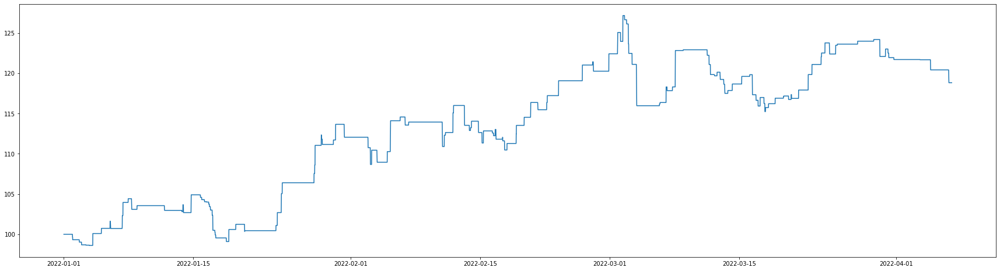

In [18]:
if reinvest_profit_flag == True:
    fig, ax = plt.subplots(figsize=(30, 8))
    ax.plot(budget_dict['time'], budget_dict['budget'])
else:
    print("Not reinvest profit")

In [19]:
if reinvest_profit_flag == True:
    print(f"Max drawdown: {round(max_drawdown * 100, 2)}%")

Max drawdown: 4.68%


In [20]:
win_rate = len(transaction_df[transaction_df['profit'] > 0]) / len(transaction_df)
print(f"Win rate: {round(win_rate * 100, 2)}%")

Win rate: 43.4%


In [21]:
for symbol in transaction_df['symbol'].unique():
    symbol_df = transaction_df[transaction_df['symbol'] == symbol]
    win_rate = len(symbol_df[symbol_df['profit'] > 0]) / len(symbol_df)
    print(f"{symbol} win rate: {round(win_rate * 100, 2)}%")

ETH-PERP win rate: 38.67%
LUNA-PERP win rate: 49.15%
SOL-PERP win rate: 43.59%


In [22]:
print(f"Distribution")
print(pd.DataFrame(transaction_df['profit_percent'].describe()))

Distribution
       profit_percent
count      212.000000
mean        -0.283864
std          2.270806
min         -4.814447
25%         -1.936427
50%         -0.779651
75%          1.446139
max          5.202311


In [23]:
for symbol in transaction_df['symbol'].unique():
    temp_return = transaction_df[transaction_df['symbol'] == symbol]['profit_percent']
    
    print(f"Distribution {symbol}:")
    print(pd.DataFrame(temp_return.describe()))
    print("\n")

Distribution ETH-PERP:
       profit_percent
count       75.000000
mean        -0.357033
std          1.901106
min         -4.327392
25%         -1.658822
50%         -0.983471
75%          1.230364
max          4.853103


Distribution LUNA-PERP:
       profit_percent
count       59.000000
mean        -0.377289
std          2.352936
min         -4.364631
25%         -2.368022
50%         -0.022100
75%          1.613086
max          3.513641


Distribution SOL-PERP:
       profit_percent
count       78.000000
mean        -0.142843
std          2.540605
min         -4.814447
25%         -1.946037
50%         -0.754605
75%          1.636126
max          5.202311


